
### Data driven prediction models of energy use of appliances in a low-energy house

This is a group project by Master 2 Data Science students at Ecole Polytechnique.

$ \textit{Authors : Sivane Marciano - Oumane Seydina Niang - Yanis Fellah - Lounes Guergous - Marvin Tordjamn - Sajjad Mahdavi}$


The data used in this study comes from Thermal Engineering and Combustion Laboratory of the University of Mons in Belgium:

<center>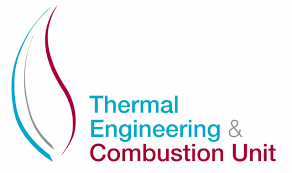</center>

The platform that maintains this challenge is RAMP, a tool developed and held by PARIS-SACLAY Center for Data Science (CDS).

<center>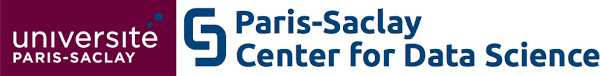</center>




### 1. Problem Statement

In this project, the objective is to predict the electricity consumption in Watt-hours of a Belgian low energy house. The explanatory variables are temperature and humidity measurements from sensors in the house, as well as weather data from a nearby station and the global consumption of the country.

### 2. Data Exploration

The data used in this challenge contains the measurements were made from January 11, 2016 at 5:00 p.m., to May 19, 2016 at 11:50 p.m. in 10-min time steps in a Begian super connected house.

#### $\bullet$ Feautures Explanation 

Below you can see the explanation for each feauture in the dataset.

* **Lights** = Light energy consumption (Wh)

* **T1**, **T2**, ..., **T9** = Temperature in room number 1, 2, ..., 9 (C)
* **RH_1**, **RH_2**, ..., **RH_9** = Humidity in room number 1, 2, ..., 9 (%)
* **T_out** = Temperature outside (from Chièvres weather station) (C)
* **RH_out** = Humidity outside (from Chièvres weather station) (%)
* **Press_mm_hg** = Pressure (from Chièvres weather station) (mm Hg)
* **Windspeed** = Windspeed (from Chièvres weather station) (m/s)
* **Visibility** = Visibility (from Chièvres weather station) (km)
* **Tdewpoint** = The dew point is the temperature to which air must be cooled to become saturated with water vapor, assuming constant air pressure and water content (C)
* **rv1**, **rv2** = Random Variable 1, 2 (Non dimensioanl)
* **NSM** = Number of seconds from midnight (NSM) (s)
* **WeekStatus** = Week status (weekend (0) or a weekday (1)) (Factor/categorical)
* **Day_of_week** = Day of week (Monday, Tuesday, ..., Sunday) (Factor/categorical)
* **DayType** = Type of day (weekdays or weekends) (Factor/categorical)
* **InstantF**
* **Instant**
* **Month** 
* **Posan**
* **Heure**
* **BE_load_actual_entsoe_transparency**
* **BE_load_forecast_entsoe_transparency**
* **BE_wind_onshore_capacity**
* **BE_wind_onshore_generation_actual**
* **BE_wind_onshore_profile**




#### $\bullet$ Inputs and outputs:

The input to this challenge is going to be an ordered slice of the collected features extracted from the sensors of the house in question. We note that these inputs will not be temporally ordered and may include temporal gaps. However, it should be noted that the step size between each sample in the training data and the test data will not be constant because to create the training data $70\%$ of the data were randomly selected and the rest as test data. This is considered one of the complexities of the challenge.

As an output, we expect a prediction of the feauture `Appliances`.

The competition consists of predicting the electricity consumption (in KWh) of a house.

#### $\bullet$ Loading required libraries

In [241]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import trange, tqdm

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error

plt.style.use('ggplot')
%matplotlib inline

#### $\bullet$ Loading the data

We have 19735 examples in hand that we split into training and testing datasets as follows :

The **training** dataset contains 70% of the original dataset. It is accessible in CSV format under the data folder.

The **testing** dataset contains 30% of the original dataset. It is accessible in CSV format under the data folder.

Just it is good to note that we do not split as in the classical time series problems. To create the train set we had to take randomly 70% of the data and the rest in the test set.

In [236]:
train = pd.read_csv('train.csv', index_col=0)
test = pd.read_csv('test.csv', index_col=0)

#### $\bullet$ Dataset insights

In [13]:
train.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,InstantF,Instant,Month,Posan,Heure,BE_load_actual_entsoe_transparency,BE_load_forecast_entsoe_transparency,BE_wind_onshore_capacity,BE_wind_onshore_generation_actual,BE_wind_onshore_profile
date,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,17:00,34.000000,1,0.030055,17,12748.260000,12409.610000,1248.71,534.440000,0.428000
2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,17:10,34.333333,1,0.030055,17,12701.126540,12433.627873,1248.71,535.768329,0.429016
2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,17:20,34.666667,1,0.030055,17,12651.444649,12394.041347,1248.71,535.378269,0.428725
2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,17:40,35.333333,1,0.030055,17,12483.352507,12266.045637,1248.71,569.373392,0.456025
2016-01-11 17:50:00,50,40,19.89,46.026667,19.2,44.500000,19.79,44.933333,18.890000,45.730000,...,17:50,35.666667,1,0.030055,17,12300.924215,12195.561917,1248.71,603.628170,0.483439


In [14]:
print(f"the shape of train dataste is = {train.shape}")
print(f"the shape of test dataste is = {test.shape}")

the shape of train dataste is = (13964, 42)
the shape of test dataste is = (5771, 42)


In [15]:
test.head()

,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,Instant,Month,Posan,Heure,BE_load_actual_entsoe_transparency,BE_load_forecast_entsoe_transparency,BE_wind_onshore_capacity,BE_wind_onshore_generation_actual,BE_wind_onshore_profile,Id
date,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:30:00,40,19.890000,46.066667,19.200000,44.590000,19.79,45.000000,18.89,45.723333,17.166667,...,35.000000,1,0.030055,17,12587.350000,12313.390000,1248.71,542.260000,0.434300,1
2016-01-11 18:00:00,50,19.890000,45.766667,19.200000,44.500000,19.79,44.900000,18.89,45.790000,17.100000,...,36.000000,1,0.030055,18,12103.180000,12072.900000,1248.71,635.310000,0.508800,2
2016-01-11 18:40:00,70,19.926667,45.863333,19.356667,44.400000,19.79,44.900000,18.89,46.430000,17.100000,...,37.333333,1,0.030055,18,11921.681035,11557.141132,1248.71,719.993346,0.576601,3
2016-01-11 18:50:00,60,20.066667,46.396667,19.426667,44.400000,19.79,44.826667,19.00,46.430000,17.100000,...,37.666667,1,0.030055,18,11819.290085,11435.165749,1248.71,710.085451,0.568667,4
2016-01-11 19:30:00,10,20.566667,53.893333,20.033333,46.756667,20.10,48.466667,19.00,48.490000,17.150000,...,39.000000,1,0.030055,19,11154.400000,10947.470000,1248.71,657.620000,0.526600,5


In [16]:
print(train.columns) # the names of the columns

Index(['Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4',
       'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9',
       'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'NSM', 'WeekStatus', 'Day_of_week',
       'DayType', 'InstantF', 'Instant', 'Month', 'Posan', 'Heure',
       'BE_load_actual_entsoe_transparency',
       'BE_load_forecast_entsoe_transparency', 'BE_wind_onshore_capacity',
       'BE_wind_onshore_generation_actual', 'BE_wind_onshore_profile'],
      dtype='object')


In [17]:
print(train.info())

<class 'pandas.core.frame.DataFrame'>
Index: 13964 entries, 2016-01-11 17:00:00 to 2016-05-19 23:50:00
Data columns (total 42 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Appliances                            13964 non-null  int64  
 1   lights                                13964 non-null  int64  
 2   T1                                    13964 non-null  float64
 3   RH_1                                  13964 non-null  float64
 4   T2                                    13964 non-null  float64
 5   RH_2                                  13964 non-null  float64
 6   T3                                    13964 non-null  float64
 7   RH_3                                  13964 non-null  float64
 8   T4                                    13964 non-null  float64
 9   RH_4                                  13964 non-null  float64
 10  T5                                    13964 non-null  f

In [23]:
#get the columns where we have na values
train.isnull().sum().sort_values(ascending = False).head(5)

RH_6          1541
Visibility      84
Appliances       0
DayType          0
Tdewpoint        0
dtype: int64

In [24]:
test.isnull().sum().sort_values(ascending = False).head(5)

RH_6          887
Visibility      7
InstantF        0
Tdewpoint       0
rv1             0
dtype: int64

In [25]:
print(train.describe())

         Appliances        lights            T1          RH_1            T2  \
count  13964.000000  13964.000000  13964.000000  13964.000000  13964.000000   
mean      97.184904      3.869951     21.539934     39.987448     20.162399   
std      102.290056      8.001951      1.532293      3.788049      2.092335   
min       10.000000      0.000000     16.790000     27.023333     16.100000   
25%       50.000000      0.000000     20.700000     37.200000     18.760000   
50%       60.000000      0.000000     21.500000     39.466667     19.790000   
75%      100.000000      0.000000     22.390000     42.647917     21.200000   
max     1080.000000     50.000000     26.260000     63.360000     29.856667   

               RH_2            T3          RH_3            T4          RH_4  \
count  13964.000000  13964.000000  13964.000000  13964.000000  13964.000000   
mean      40.212975     22.051263     39.132260     20.672828     38.774971   
std        3.917717      1.856831      3.249360    

In [26]:
train.describe(include=object) #so that we can see some descriptive statistices for the object columns as well


,WeekStatus,Day_of_week,DayType,InstantF
count,13964,13964,13964,13964
unique,2,7,7,144
top,Weekday,Tuesday,Tue,03:00
freq,10093,2061,2061,107


#### $\bullet$ Feautures Exploration

In this part we'll try to further understand the features in our dataset, mainly the different classes of the labels which is our target variable.

We'll also see if there are any missing values.

In [27]:
train.isnull().sum().sort_values(ascending = False).head(5)

RH_6          1541
Visibility      84
Appliances       0
DayType          0
Tdewpoint        0
dtype: int64

In [28]:
test.isnull().sum().sort_values(ascending = False).head(5)

RH_6          887
Visibility      7
InstantF        0
Tdewpoint       0
rv1             0
dtype: int64

#### $\bullet$ Feautures Exploration 

##### Appliances

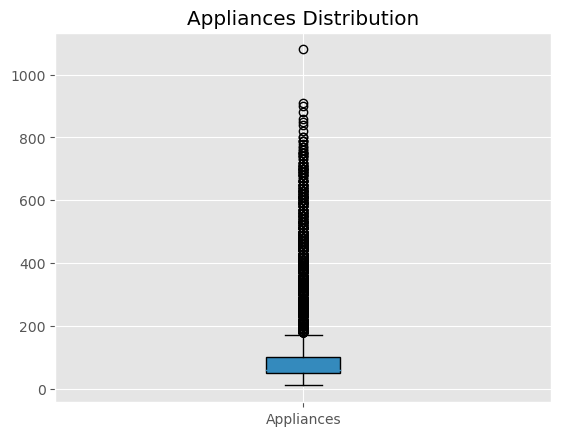

In [99]:
plt.boxplot(train['Appliances'], patch_artist=True, labels = ['Appliances'])
plt.title('Appliances Distribution')
plt.show()

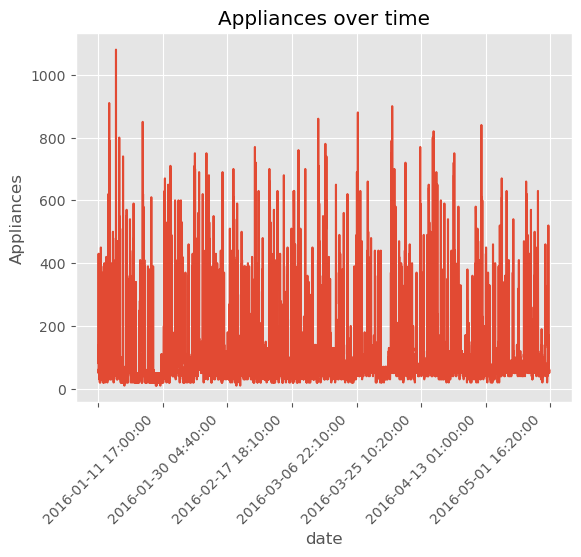

In [94]:
train['Appliances'].plot()
plt.ylabel('Appliances')
plt.title('Appliances over time')
plt.xticks(rotation=45)
plt.show()

Text(0.5, 1.0, 'Histogramme des Appliances')

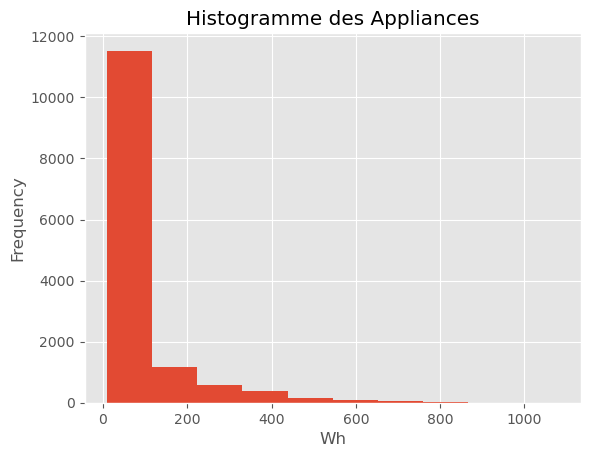

In [208]:
plt.hist(train['Appliances'])
plt.xlabel("Wh")
plt.ylabel("Frequency")
plt.title("Histogramme des Appliances")

/var/folders/ns/9pn3g4gn09s4qsz_80v265wr0000gn/T/ipykernel_5172/3170447677.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(corr, dtype=np.bool))


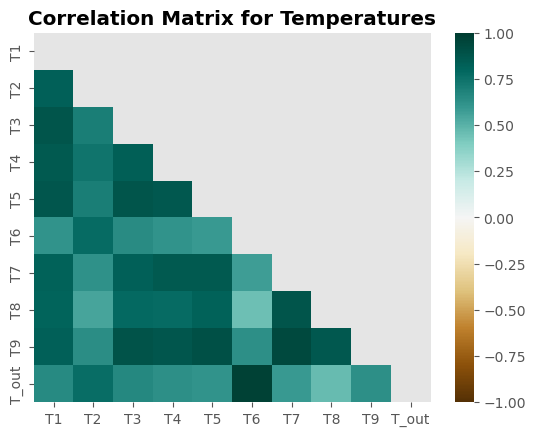

In [114]:
#Calculating the correlation for temperatures
corr = train.filter(like='T').iloc[:,0:10].corr()

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(corr, dtype=bool))

sns.heatmap(corr, mask=mask, vmax = 1, vmin = -1, cmap='BrBG')
plt.title("Correlation Matrix for Temperatures" , fontweight='bold')
plt.show()

/var/folders/ns/9pn3g4gn09s4qsz_80v265wr0000gn/T/ipykernel_5172/2732315727.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(corr, dtype=np.bool))


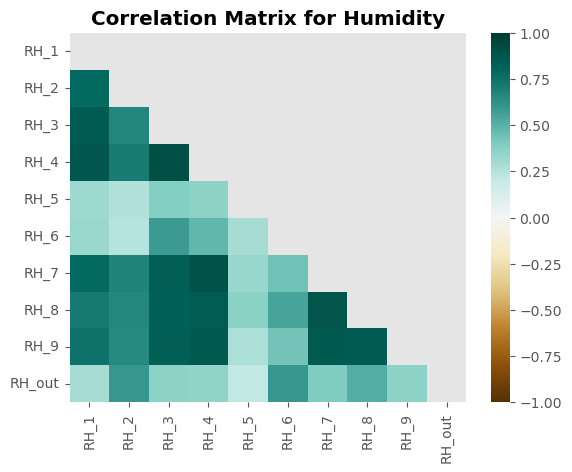

In [113]:
#Calculating the correlation for Humidity
corr = train.filter(like='R').iloc[:,0:10].corr()

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(corr, dtype=bool))

sns.heatmap(corr, mask=mask, vmax = 1, vmin = -1, cmap='BrBG')
plt.title("Correlation Matrix for Humidity" , fontweight='bold')
plt.show()

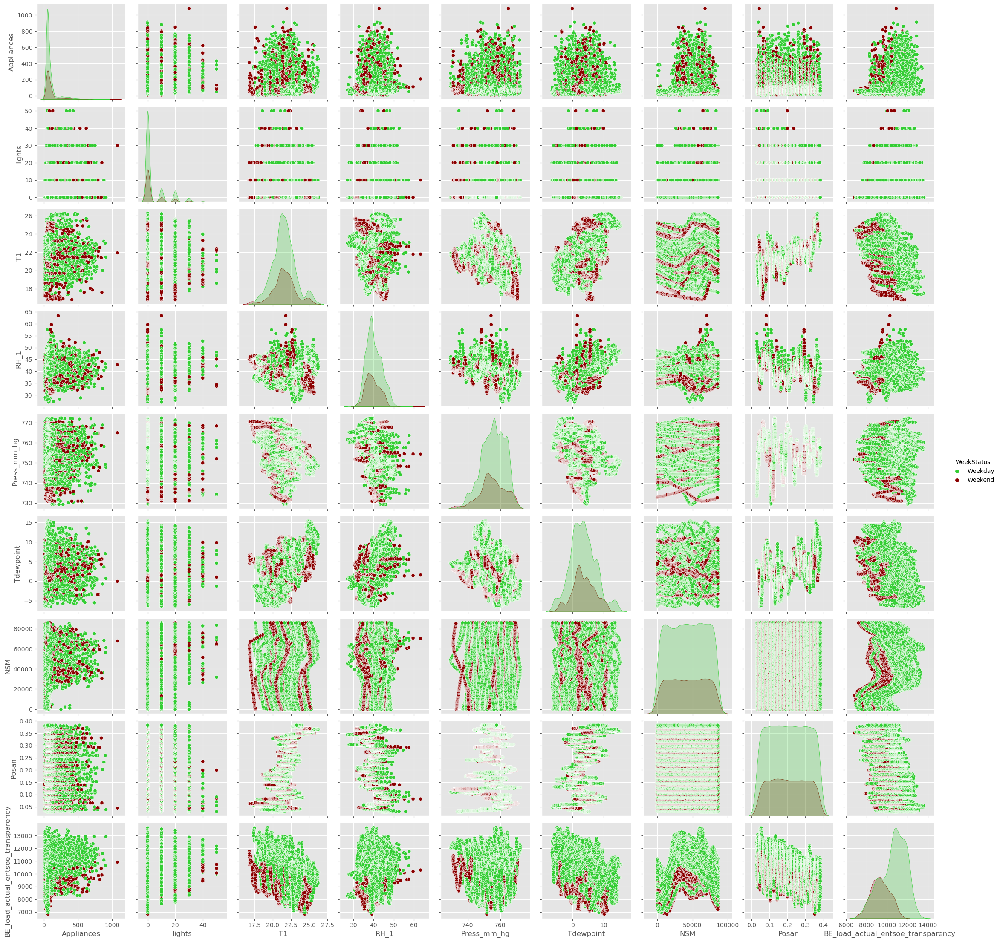

In [125]:
df = train[['Appliances', 'lights', 'T1', 'RH_1', 'Press_mm_hg','Tdewpoint', 'NSM', 'Posan', 'BE_load_actual_entsoe_transparency' ,'WeekStatus']]

sns.pairplot(df , hue = 'WeekStatus', palette=['limegreen','darkred'] )

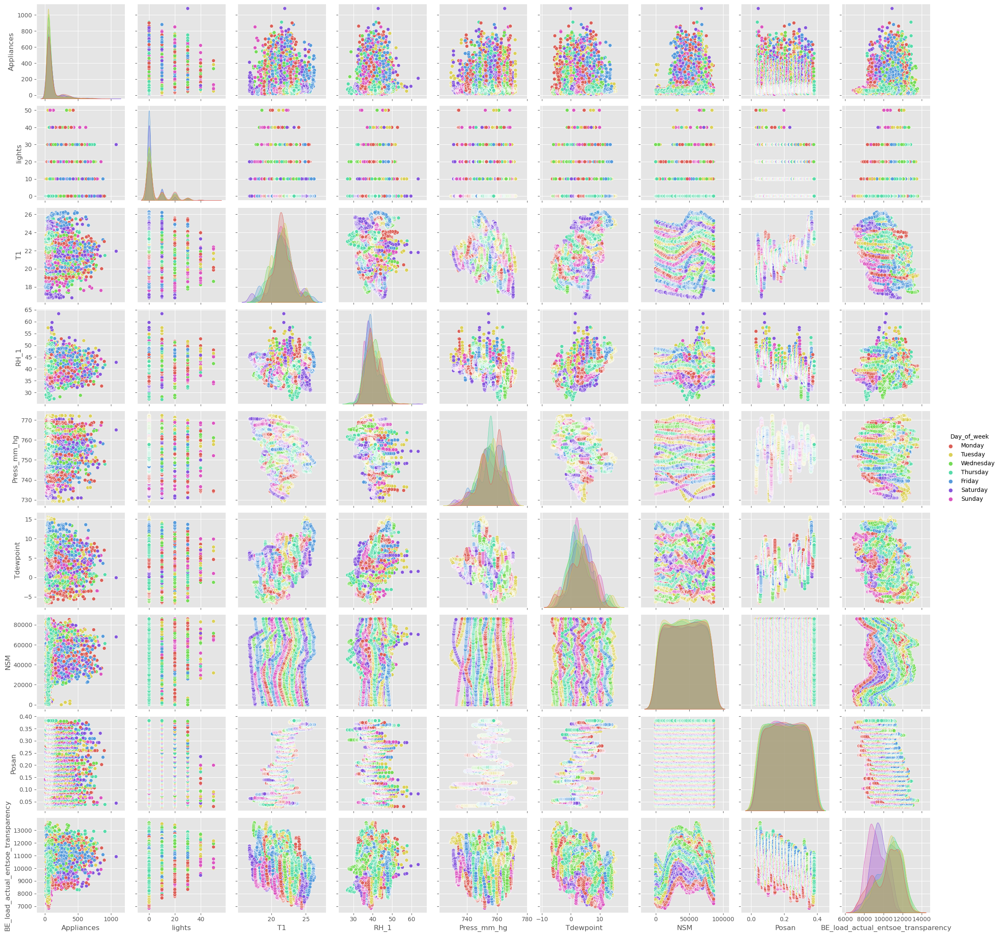

In [137]:
df = train[['Appliances', 'lights', 'T1', 'RH_1', 'Press_mm_hg','Tdewpoint', 'NSM', 'Posan', 'BE_load_actual_entsoe_transparency' ,'Day_of_week']]

sns.pairplot(df , hue = 'Day_of_week', palette=sns.color_palette("hls", 7) )

##### The evolution of Appliances in January and February

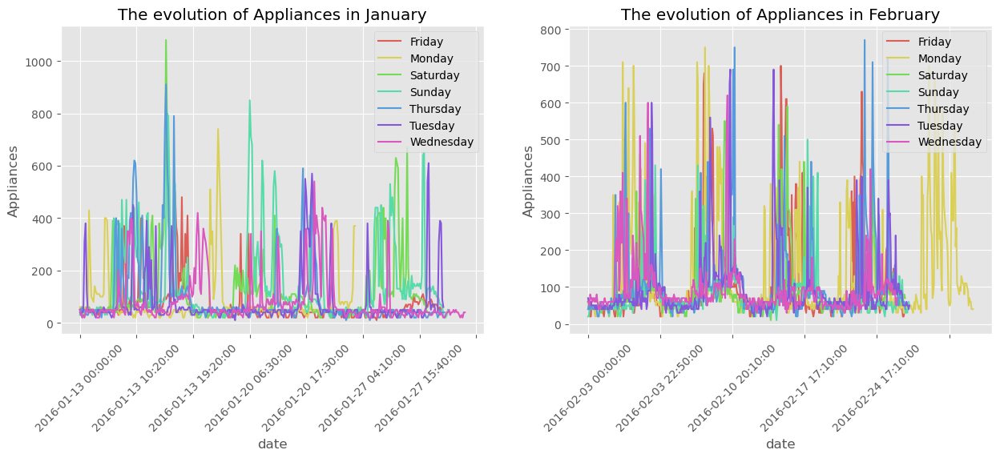

In [161]:
fig = plt.figure(figsize=(15,5))
colors = sns.color_palette("hls", 7)

ax = fig.add_subplot(1, 2, 1)
df_jan = train[train['Month'] == 1][['Appliances', 'Day_of_week']]
for idx, (name, group) in enumerate(df_jan.groupby('Day_of_week')):
    group['Appliances'].plot(color= colors[idx], label = name)
plt.legend()
plt.xticks(rotation=45)
plt.ylabel('Appliances')
plt.title('The evolution of Appliances in January')

ax = fig.add_subplot(1, 2, 2)
df_fev = train[train['Month'] == 2][['Appliances', 'Day_of_week']]
for idx, (name, group) in enumerate(df_fev.groupby('Day_of_week')):
    group['Appliances'].plot(color= colors[idx], label = name)
plt.legend()
plt.xticks(rotation=45)
plt.ylabel('Appliances')
plt.title('The evolution of Appliances in February')
plt.show()


##### Appliances evolution on a winter and spring day

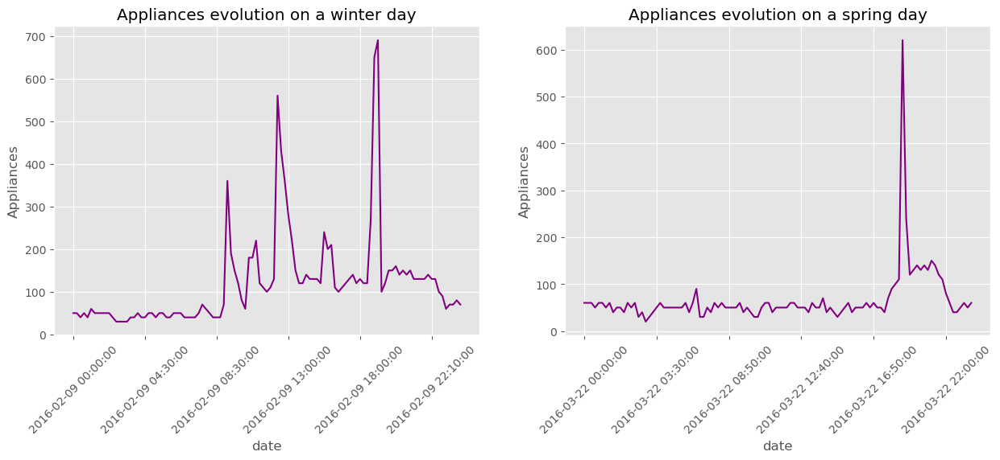

In [195]:
fig = plt.figure(figsize=(15,5))

# A Day in winter
ax = fig.add_subplot(1, 2, 1)
start_date = '2016-02-08'
end_date = '2016-02-09'
dates = pd.to_datetime(train.index).strftime('%Y-%m-%d')
mask = (dates > start_date) & (dates <= end_date)
train.loc[mask]['Appliances'].plot(color = 'purple')
plt.xticks(rotation=45)
plt.title('Appliances evolution on a winter day')
plt.ylabel('Appliances')

# A Day in Spring
ax = fig.add_subplot(1, 2, 2)
start_date = '2016-03-21'
end_date = '2016-03-22'
dates = pd.to_datetime(train.index).strftime('%Y-%m-%d')
mask = (dates > start_date) & (dates <= end_date)
train.loc[mask]['Appliances'].plot(color = 'purple')
plt.xticks(rotation=45)
plt.title('Appliances evolution on a spring day')
plt.ylabel('Appliances')


plt.show()

### 3. Data pre-processing 

##### $\bullet$ Categorical Features

In [196]:
valeur_categorielle = train.iloc[:, 30:34]
for a in valeur_categorielle.columns[:3]:
    print(a, valeur_categorielle[a].unique())

Day_of_week ['Monday' 'Tuesday' 'Wednesday' 'Thursday' 'Friday' 'Saturday' 'Sunday']
DayType ['Mon' 'Tue' 'Wed' 'Thu' 'Fri' 'Sat' 'Sun']
InstantF ['17:00' '17:10' '17:20' '17:40' '17:50' '18:10' '18:20' '18:30' '19:00'
 '19:10' '19:20' '19:40' '20:00' '20:10' '20:20' '20:50' '21:00' '21:10'
 '21:20' '21:40' '21:50' '22:00' '22:10' '22:20' '22:30' '22:40' '23:00'
 '23:10' '23:20' '23:30' '23:40' '23:50' '00:00' '00:10' '00:20' '00:30'
 '00:40' '01:00' '01:20' '01:40' '01:50' '02:00' '02:10' '02:30' '02:40'
 '03:00' '03:10' '03:30' '03:40' '04:10' '04:20' '04:30' '04:40' '04:50'
 '05:00' '05:30' '05:40' '05:50' '06:20' '06:30' '06:40' '06:50' '07:00'
 '07:10' '07:30' '07:40' '08:00' '08:10' '08:20' '08:30' '08:40' '08:50'
 '09:00' '09:10' '09:20' '09:30' '09:40' '09:50' '10:00' '10:20' '10:30'
 '10:40' '11:00' '11:10' '11:20' '11:30' '11:40' '11:50' '12:00' '12:10'
 '12:20' '12:40' '12:50' '13:10' '13:20' '13:40' '13:50' '14:00' '14:10'
 '14:30' '14:50' '15:10' '15:20' '15:30' '15:40' '1

In [197]:
valeur_categorielle['Day_of_week2'] = [word[:3] for word in valeur_categorielle['Day_of_week']]

In [199]:
valeur_categorielle[valeur_categorielle['DayType']!=valeur_categorielle['Day_of_week2']]

,Day_of_week,DayType,InstantF,Instant,Day_of_week2
date,,,,,


The `DayType` and `Day_of_week` columns are the same, so we can delete the DayType column

In [213]:
train_copy = train.copy()
train_copy.drop(columns='DayType', inplace=True)

##### Day type column: `WeekStatus`

In [214]:
train_copy['WeekStatus_numerical'] = [0 if s == 'Weekend' else 1 for s in train['WeekStatus']]

The `WeekStatus` column is changed to a numeric column that codes 0 if it is a weekend day and 1 if it is a weekday.

In [215]:
train_copy.drop(columns='WeekStatus', inplace=True)

##### Time of day column: `InstantF`

In [216]:
train_copy[['InstantF', 'Instant']].sort_values(by="InstantF").head(5)

,InstantF,Instant
date,,
2016-04-25 00:00:00,00:00,0.0
2016-04-06 00:00:00,00:00,0.0
2016-03-15 00:00:00,00:00,0.0
2016-03-06 00:00:00,00:00,0.0
2016-02-12 00:00:00,00:00,0.0


`InstantF` is already modified in the `Instant` column, so we can delete it

In [217]:
train_copy.drop(columns='InstantF', inplace=True)

##### Days of the week column: `Day_of_week`

In [218]:
train_copy['Day_of_week'].unique()

array(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday',
       'Sunday'], dtype=object)

Encoding categorical variables using sine and cosine functions is a popular method for encoding cyclical data like days of the week, months of the year, or time of day.

The idea behind this method is to represent the cyclical nature of the data in a continuous space that machine learning algorithms can understand. Sine and cosine functions are ideal for this because they are periodic functions that repeat themselves every $2\pi$ units, which is equivalent to one cycle.

To use this method for encoding days of the week, we can represent each day as an angle in radians, where 0 corresponds to Sunday, and $\frac{2\pi}{7}$ corresponds to Saturday.
We can then compute the sine and cosine of this angle and use these as numerical features in your machine learning model.

In [219]:
# encode days of the week using sine and cosine functions
day_in_radians = 2*np.pi*train['Day_of_week'].map({'Monday': 0, 'Tuesday': 1/7, 'Wednesday': 2/7, 'Thursday': 3/7, 'Friday': 4/7, 'Saturday': 5/7, 'Sunday': 6/7})
train_copy['day_of_week_sin'] = np.sin(day_in_radians)
train_copy['day_of_week_cos'] = np.cos(day_in_radians)
train_copy.drop(columns='Day_of_week', inplace=True)

The following function allows us to transfer the categorial variables into numerical variables as explained in the previous part.

In [223]:
def categorical_col_process(df):
    
    df_changed = df.copy()
    col = ['WeekStatus', 'Day_of_week', 'DayType', 'InstantF']
    for a in col:
        if a not in df:
            return False 
    
    # WeekStatus column
    df_changed['WeekStatus_numerical'] = [0 if s == 'Weekend' else 1 for s in df['WeekStatus']]
    
    # Day_of_the_week column 
    day_in_radians = 2*np.pi*df['Day_of_week'].map({'Monday': 0, 'Tuesday': 1/7, 'Wednesday': 2/7, 'Thursday': 3/7, 'Friday': 4/7, 'Saturday': 5/7, 'Sunday': 6/7})
    df_changed['day_of_week_sin'] = np.sin(day_in_radians)
    df_changed['day_of_week_cos'] = np.cos(day_in_radians)

    df_changed.drop(columns=col, inplace=True)
    
    return df_changed

##### $\bullet$ Feauture Importance

In [ ]:
#Sivane(Shap) + Yanis (Feauture importance with Random Forest )
#jsp si c'est necessaire en vrai 

##### $\bullet$ Missing Values

In [ ]:
#Lounes 

### 4. Workflow

Now we are ready to apply our models on the training and test data using the functions proposed in the previous section to transform them into category feautures and address the problem of missing values.

In [237]:
train = categorical_col_process(train)
test = categorical_col_process(test)

X_train = train.loc[:, train.columns != 'Appliances']
y_train = train.loc[:, train.columns == 'Appliances'] 
X_test = test.loc[:, test.columns != 'Appliances']
y_test = test.loc[:, test.columns == 'Appliances'] 


##### $\bullet$ Linear Regression

In [ ]:
regressor = LinearRegression()

clf = Pipeline(steps=[
    ('transformer', StandardScaler()),
    ('classifier', regressor)])

clf.fit(X_train, y_train)

In [ ]:
y_pred = clf.predict(X_test)
print(f"MSE: {mean_squared_error(y_test.values,y_pred):.4f}")

##### $\bullet$ SVM

In [ ]:
regressor = SVR()

clf = Pipeline(steps=[
    ('transformer', StandardScaler()),
    ('classifier', regressor)])

clf.fit(X_train, y_train)

In [ ]:
y_pred = clf.predict(X_test)
print(f"MSE: {mean_squared_error(y_test.values,y_pred):.4f}")

### 5. Submission details

Your RAMP submission should be in the folder "submissions", inside its own folder. This folder itself should contain a file named  <mark> estimator.py </mark> (e.g "submissions/my_submission/estimator.py"). 
<br>
<br>
Note that the estimator.py file returns a pipeline that first consists of the feature extraction step, then the classification. This file was defined as follows in order to enable you to play with your own features and design your pipeline. So, be creative!

### 6. Ramp Tutorial


### Quick submission test

Finally, make sure the local processing goes through by running the
```
ramp-test --submission <submission folder>
```
If you want to quickly test the that there are no obvious code errors, use the `--quick-test` flag to only use a small subset of the data (training and testing sets with 5 elements each).

```
ramp-test --submission <submission folder> --quick-test
```

See the [online documentation](https://paris-saclay-cds.github.io/ramp-docs/ramp-workflow/stable/using_kits.html) for more details.